In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import os
%matplotlib inline

In [2]:
from sklearn.model_selection import train_test_split
from auto_ml import Predictor

In [3]:
def run_auto_ml(df):
    X_train, X_test, y_train, y_test = train_test_split(df.drop('groupe', axis=1),df['groupe'],test_size=0.3)
    df_train = X_train.join(y_train)
    df_test = X_test.join(y_test)
    #print(df_train.head())

    column_descriptions = {
        'groupe': 'output',
        'I_SI_QUARINSEE': 'categorical',
        'I_AP_TYPELIEU2': 'categorical',
        'file_name': 'ignore',
        'cle': 'ignore'
    }

    ml_predictor = Predictor(type_of_estimator='classifier',column_descriptions=column_descriptions)
    ml_predictor.train(df_train, ml_for_analytics=True)

    print(f'>>> predictor score {ml_predictor.score(df_test, df_test.groupe)}')
    
    df = pd.concat([df_test,df_train])
    #print(df.head())

    #predictions = ml_predictor.predict(df_test)
    #df_test['preds']=predictions
    predictions = ml_predictor.predict(df)
    df['preds']=predictions
    return df 

In [4]:
df = pd.read_csv('Mairie_appels_filename_labels2.csv',sep=";")
df['groupe']=df.L_EQUIPE.apply(lambda x: x.split(':')[0])
df_preparation = df.drop(['NO_APPEL', 'L_EQUIPE','C_TYPEPB','N_SITE', 'CP_SITE', 'CO_SITE', 'D_CREATION', 'L_FULLNAMETYPEPB','DE_SYMPAPPEL', 'D_APPEL', 'L_STAPPEL', 
          'I_AP_EQASS', 'I_AP_MODESIGNAL', 'I_AP_CAUSE', 'NVL(A.I_AP_NO,A.I_AP_UTNO)', 'I_AP_TYPEDEM', 'I_AP_DANGER2', 'I_AP_DOMAINE',
         'I_AP_PRECLIEU','I_AP_SANTE_PUB', 'I_AP_COORD_X', 'I_AP_COORD_Y', 'C_MEMO', 'C_DEFDOCOLE'],axis=1)

In [5]:
df_preparation.describe()

,cle,Alley,Alleyway,Aluminium,Apartment Building,Asphalt,Automobile,Awning,Basketball,Basketball Court,...,Arrow,Canoe,Coal,Crocodile,Digital Watch,Golf,Lathe,Modern Art,Offroad,Turnstile
count,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000,...,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000,4005.000000
mean,25383.107615,2.952407,2.434683,0.837541,0.804503,10.227582,11.048108,0.131528,0.476131,0.476131,...,0.046412,0.022692,0.016999,0.021433,0.015777,0.019322,0.021454,0.021488,0.024517,0.024665
std,2843.484802,14.892438,13.672589,8.825356,7.883630,27.079877,29.601167,3.174494,6.440381,6.440381,...,2.076765,1.436087,1.075788,1.356360,0.998480,1.222775,1.357746,1.359846,1.551540,1.560936
min,19519.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23205.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,25609.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,27832.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,29813.000000,98.441978,98.441978,99.313339,93.989754,99.175331,99.293068,88.565659,98.643494,98.643494,...,93.996956,90.882835,68.081291,85.837357,63.188850,77.383385,85.925034,86.057953,98.189339,98.783966


In [ ]:
df_preparation.head()

### photos sans label

In [8]:
labels_cols= list(df_preparation)
labels_cols.remove('cle')
labels_cols.remove('I_SI_QUARINSEE')
labels_cols.remove('I_AP_TYPELIEU2')
labels_cols.remove('groupe')
labels_cols.remove('file_name')
labels_cols.sort()
df_preparation['sum'] = df_preparation[labels_cols].sum(axis=1)

nb = df_preparation[df_preparation['sum'] == 0].cle.count()
print(f'nombre labels collectés {len(labels_cols)}, nb images sans label {nb}')

nombre labels collectés 618, nb images sans label 489


In [9]:
df_preparation_withlabels = df_preparation[df_preparation['sum'] != 0]
df_preparation_withlabels.drop('sum',axis=1,inplace=True)

In [10]:
df2 = run_auto_ml(df_preparation_withlabels)

Welcome to auto_ml! We're about to go through and make sense of your data using machine learning, and give you a production-ready pipeline to get predictions with.

If you have any issues, or new feature ideas, let us know at http://auto.ml
You are running on version 2.9.10
Now using the model training_params that you passed in:
{}
After overwriting our defaults with your values, here are the final params that will be used to initialize the model:
{'presort': False, 'learning_rate': 0.1, 'warm_start': True}
Running basic data cleaning
Fitting DataFrameVectorizer
Now using the model training_params that you passed in:
{}
After overwriting our defaults with your values, here are the final params that will be used to initialize the model:
{'presort': False, 'learning_rate': 0.1, 'warm_start': True}


********************************************************************************************
About to fit the pipeline for the model GradientBoostingClassifier to predict groupe
Started at:
2

In [ ]:
df2.head()

In [12]:
df2_false = df2[df2.groupe != df2.preds]
df2_true = df2[df2.groupe == df2.preds]
print(f'nb images bien classées {len(df2_true.index)}, nb images mal classées {len(df2_false.index)}')

nb images bien classées 2371, nb images mal classées 1145


In [13]:
def images_subset_plot(title,df,groupe,p):
    l = len(df[df.groupe==groupe].index)

    images = []
    if l > 20:
        subset = df[df.groupe==groupe].sample(20)
    else:
        subset = df[df.groupe==groupe]
    for index, row in enumerate(subset.file_name):
        images.append(mpimg.imread(p+row))

    plt.figure(figsize=(20,10))
    plt.suptitle('========groupe {} - {} images - {} ========'.format(groupe,l,title), fontsize=16)
    columns = 5
    for i, image in enumerate(images):
        plt.subplot(len(images) / columns + 1, columns, i + 1)
        plt.axis('off')
        plt.imshow(image)

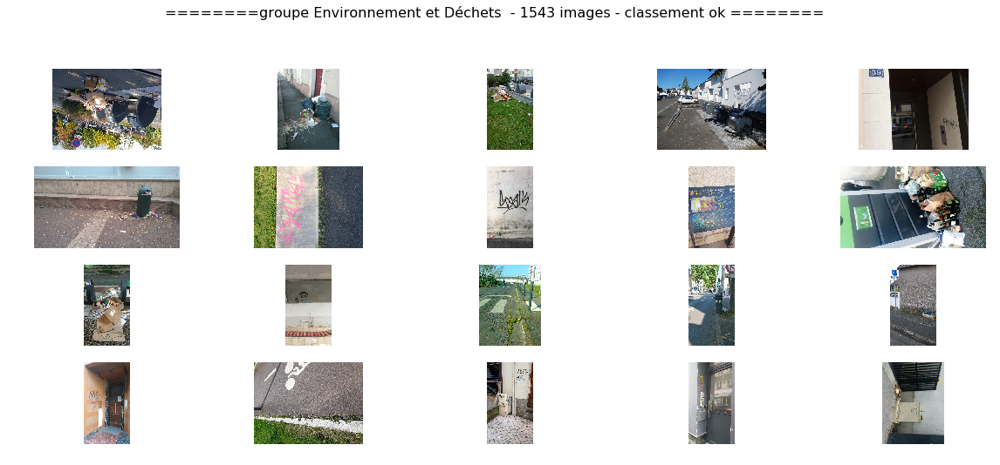

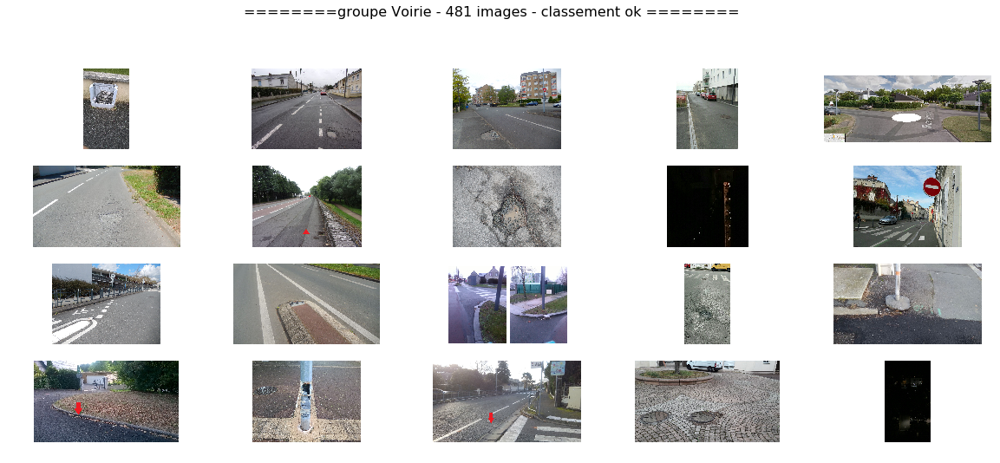

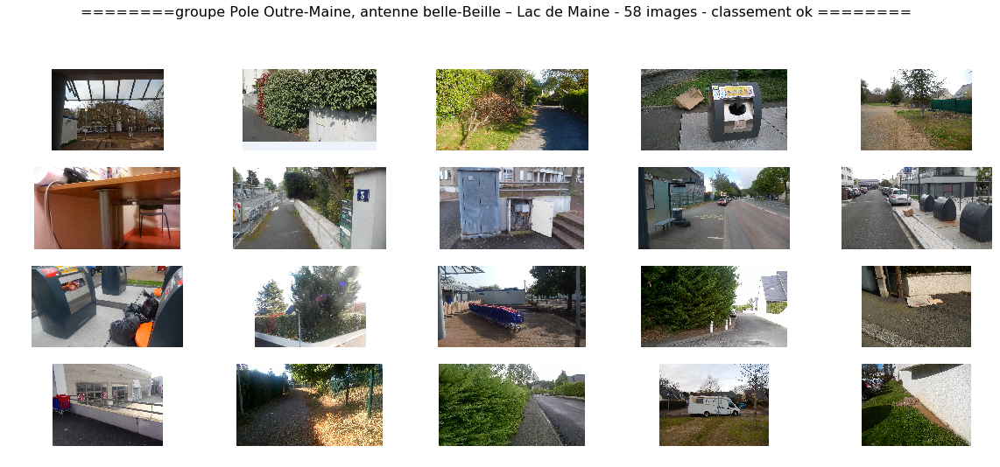

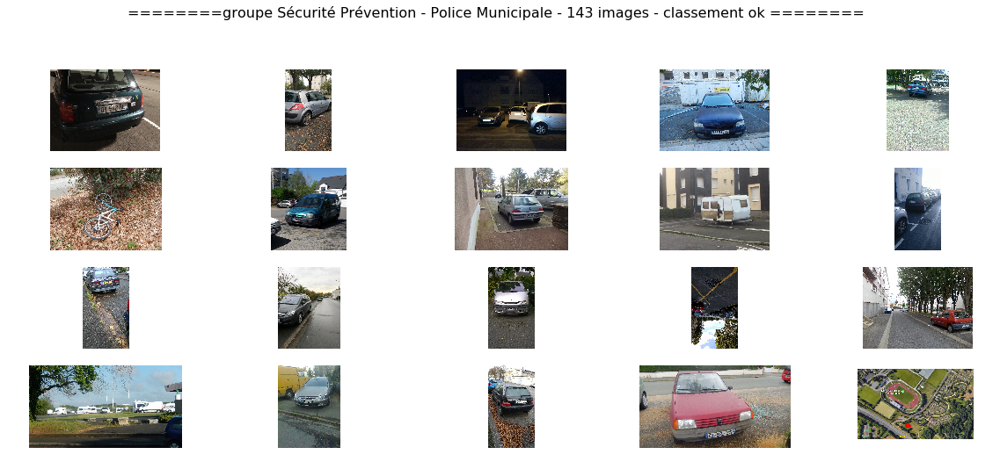

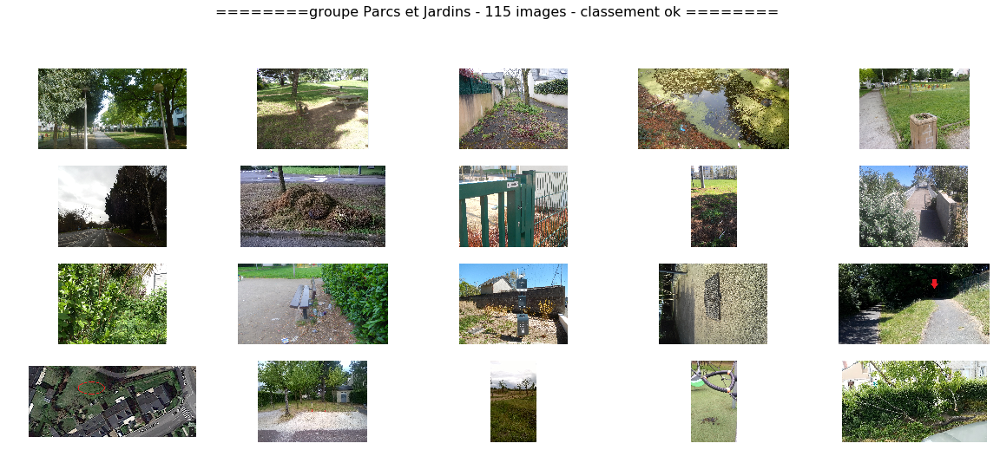

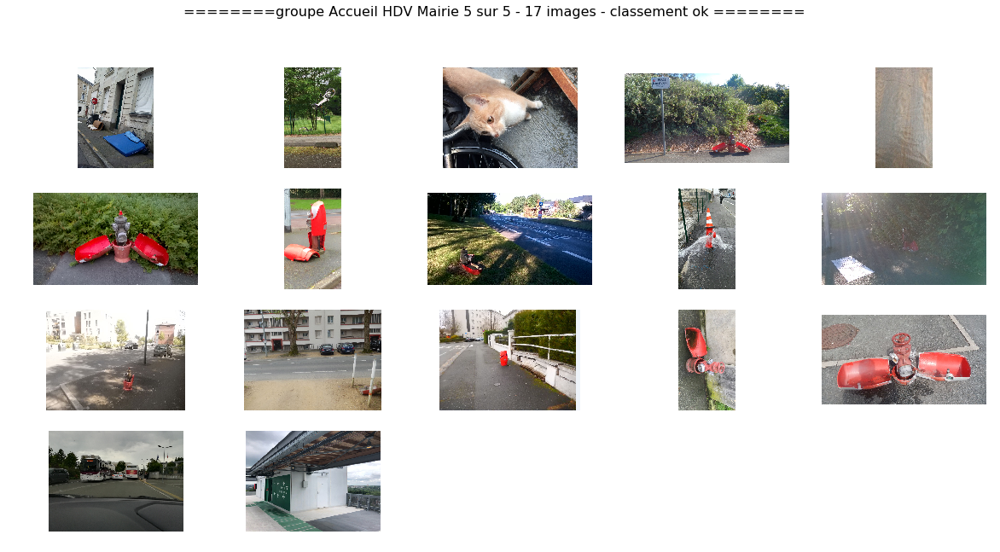

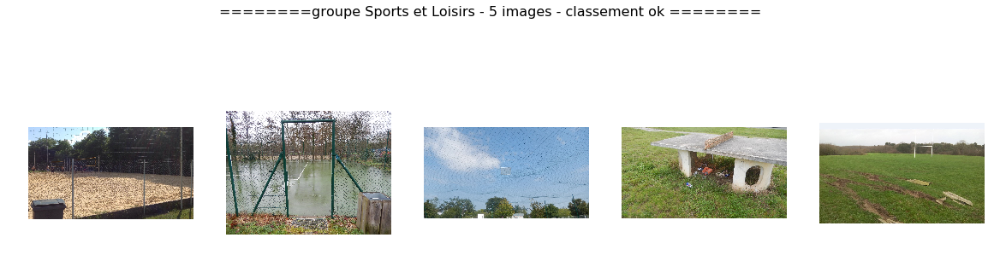

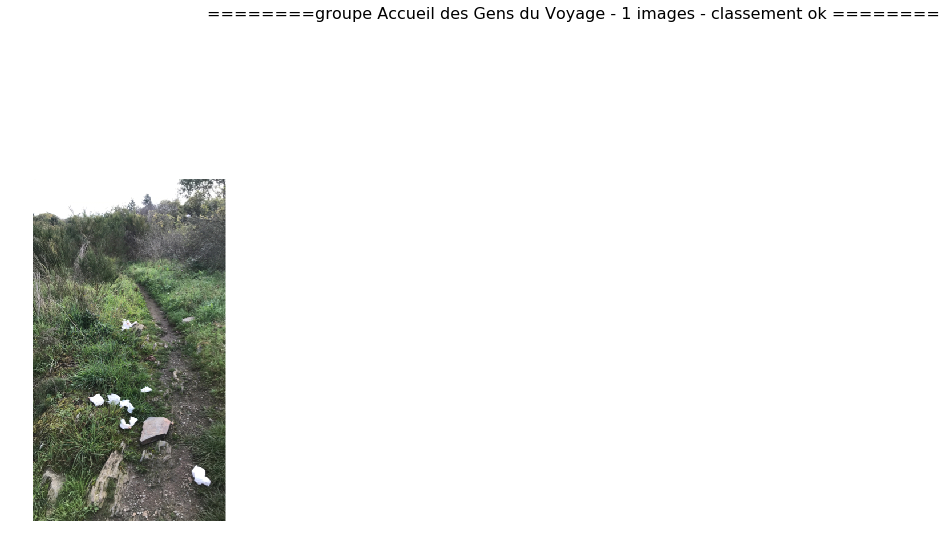

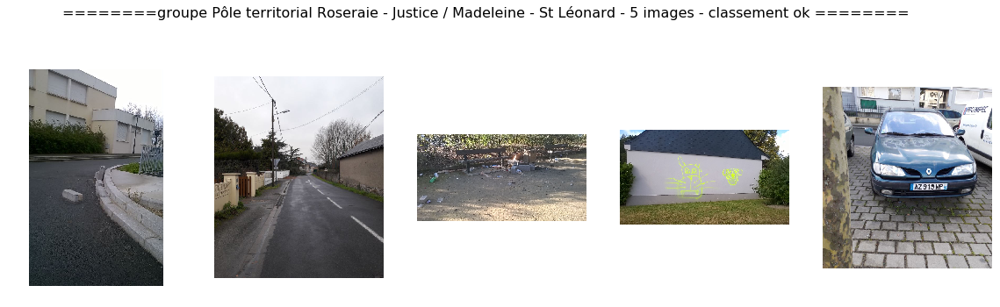

<Figure size 1440x720 with 0 Axes>

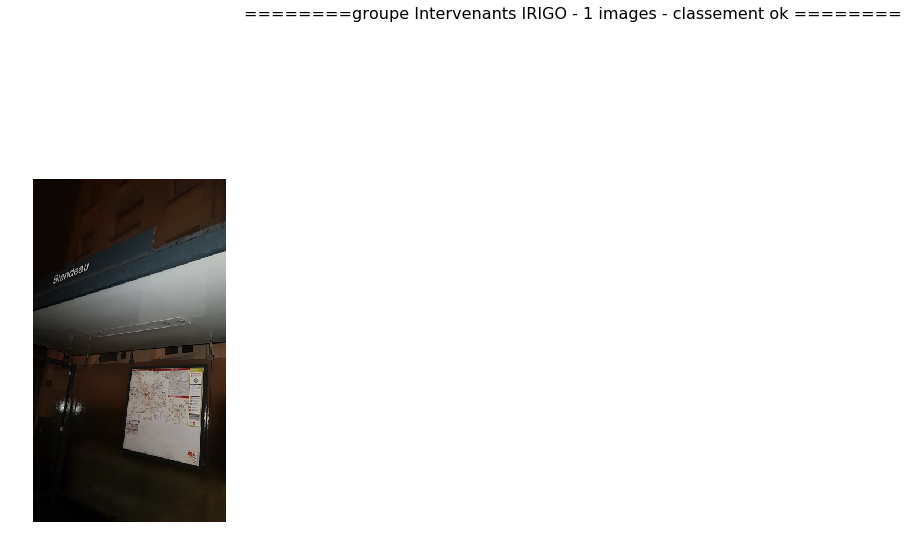

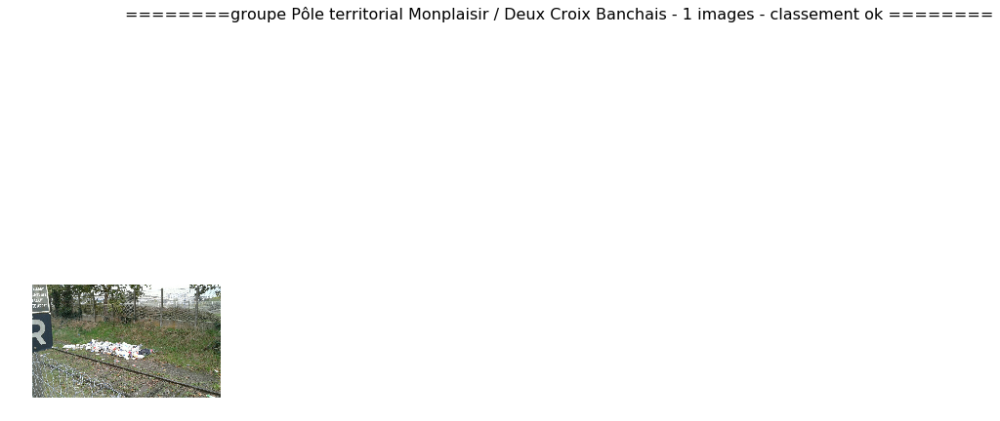

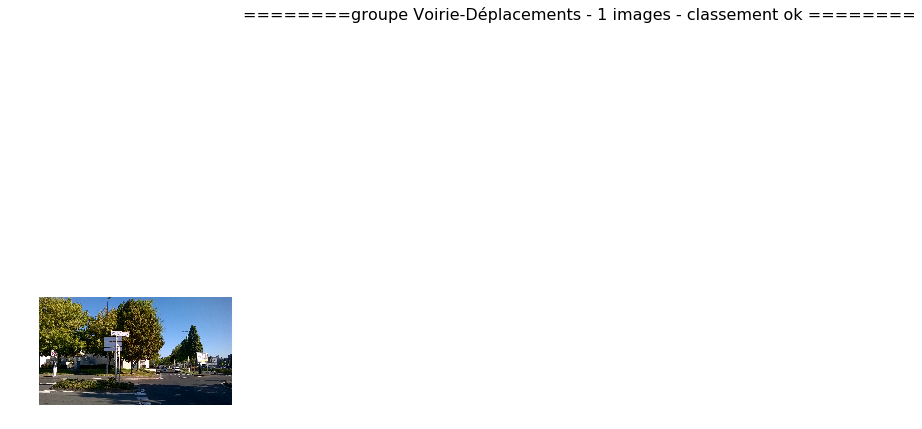

In [16]:
for gp in df_preparation.groupe.unique():
    images_subset_plot('classement ok',df2_true,gp,'./Upload/')

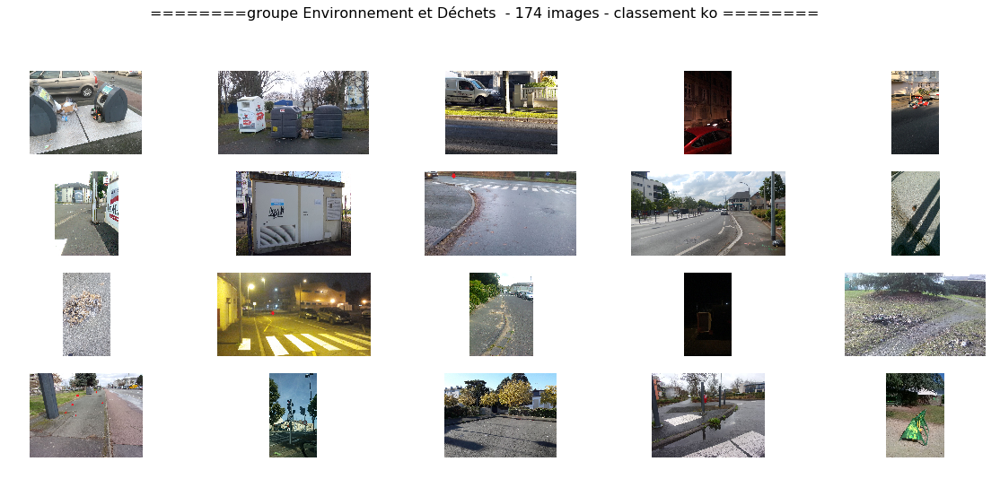

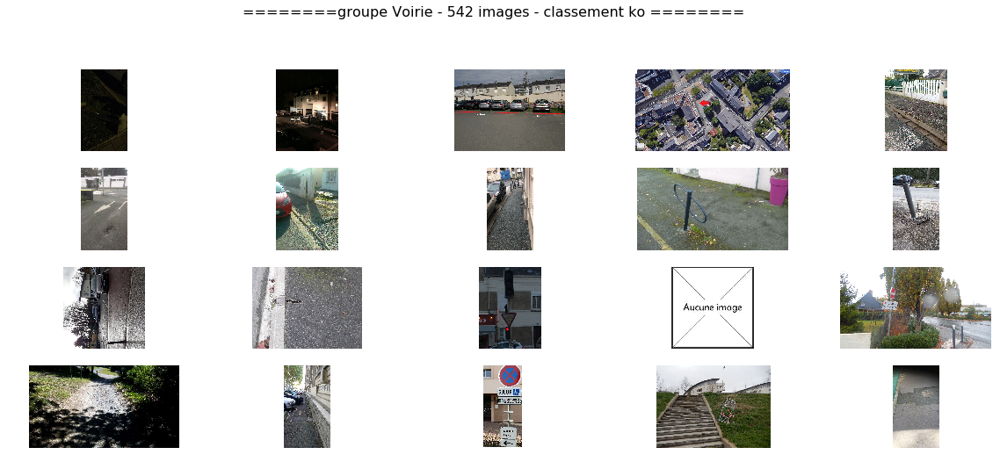

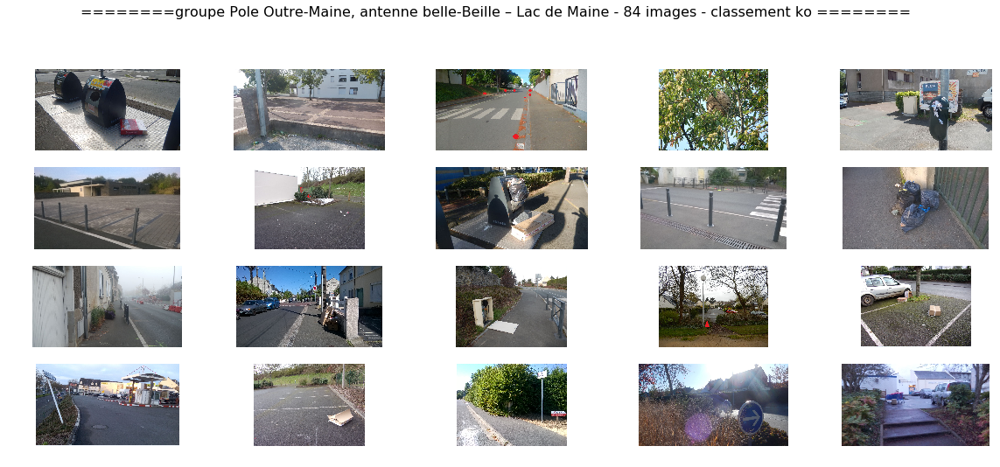

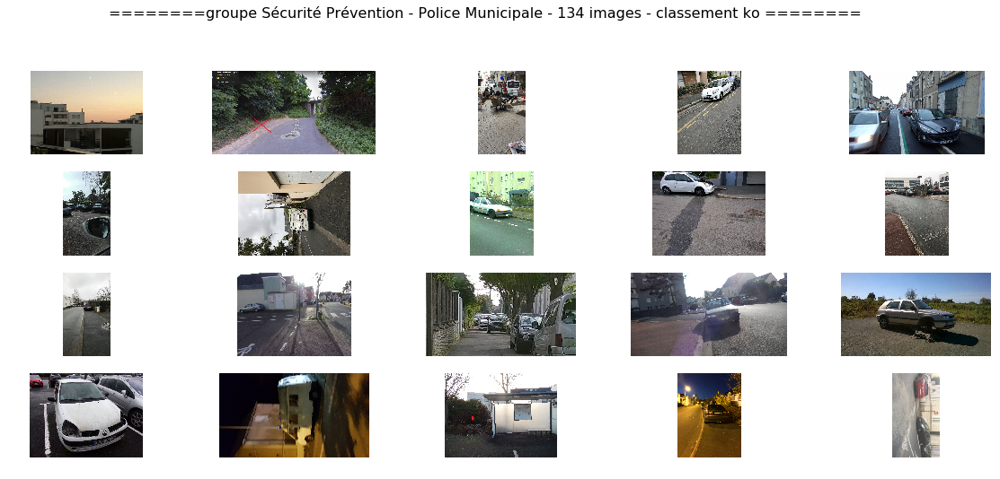

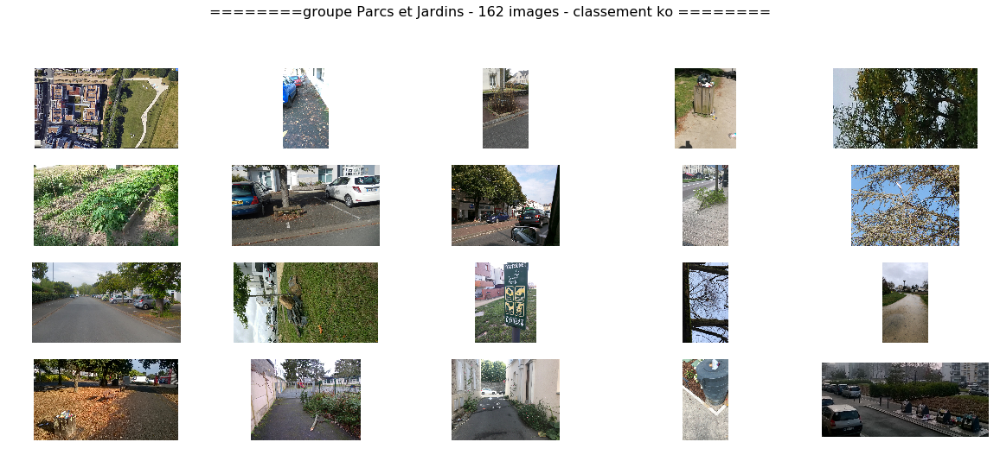

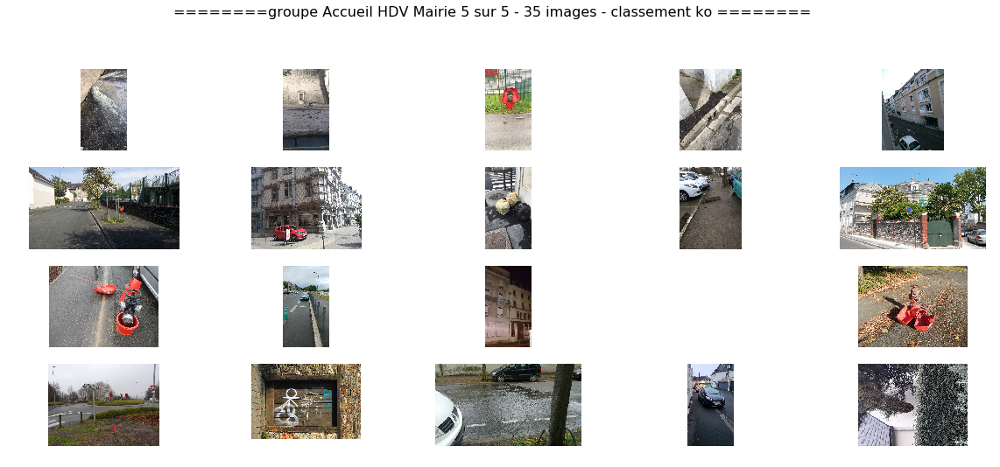

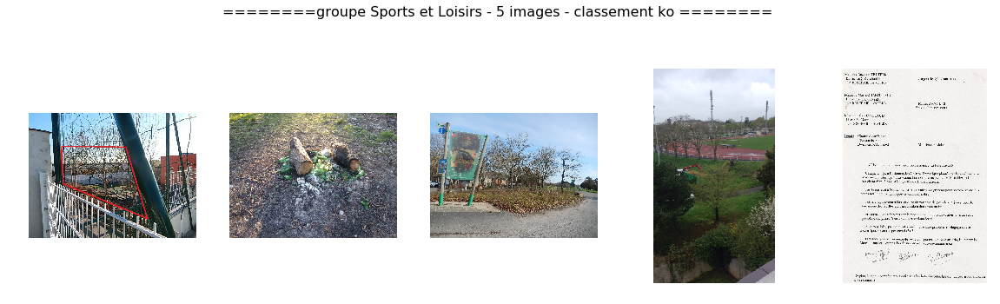

<Figure size 1440x720 with 0 Axes>

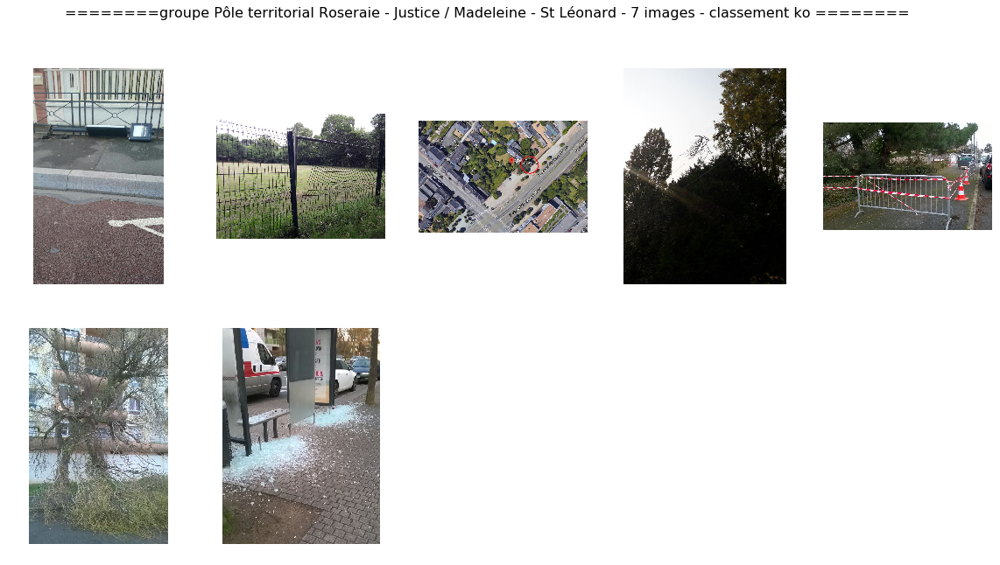

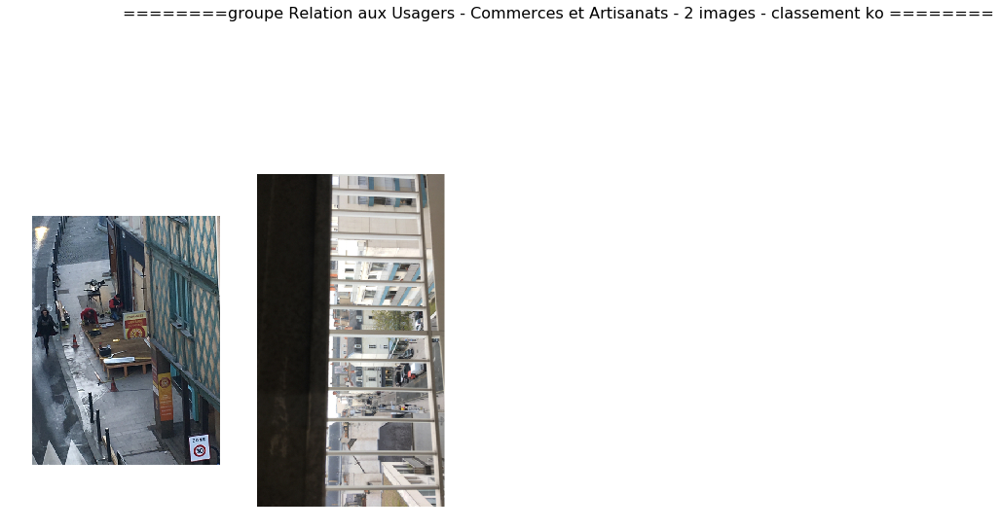

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

In [15]:
for gp in df_preparation.groupe.unique():
    images_subset_plot('classement ko',df2_false,gp,'./Upload/')

### photos avec la valeur max pour chaque label
977 labels

In [ ]:
x = list(filter(lambda s: s[0] == 'Z', labels_cols))
for l in x:
    image = df[df[l] == df_preparation_withlabels[l].max()].file_name.iloc[0]
    print(f'label {l} : {image}')    
    img=mpimg.imread('Upload/'+image)
    imgplot = plt.imshow(img)
    plt.show()

### keep significant labels
112